In [ ]:
!pip install -U -q segmentation-models
!pip install -q tensorflow
!pip install -q keras
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.9 MB/s eta 0:00:00
Segmentation Models: using `tf.keras` framework.


In [ ]:
#import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

from tqdm.notebook import tqdm_notebook, tnrange
from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from tensorflow.keras.layers import concatenate,add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import img_to_array,load_img,array_to_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.utils import class_weight
from keras.utils import normalize
from keras.metrics import MeanIoU
import segmentation_models as sm

import glob

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/My Drive/Dataset_Capstone/test.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/test.zip
   creating: test/
   creating: test/SS_EA001/
  inflating: __MACOSX/test/._SS_EA001  
  inflating: test/.DS_Store          
  inflating: __MACOSX/test/._.DS_Store  
   creating: test/SS_EA041/
  inflating: __MACOSX/test/._SS_EA041  
   creating: test/SS_EA025/
  inflating: __MACOSX/test/._SS_EA025  
   creating: test/SS_EA034/
   creating: test/SS_EA002/
  inflating: __MACOSX/test/._SS_EA002  
  inflating: test/SS_EA001/EA_001_VarFat_293_mask.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_293_mask.png  
  inflating: test/SS_EA001/EA_001_VarFat_285_mask.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_285_mask.png  
  inflating: test/SS_EA001/EA_001_VarFat_285_img.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_285_img.png  
  inflating: test/SS_EA001/EA_001_VarFat_290_img.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_290_img.png  
  inflating: test/SS_EA001/EA_001_VarFat_280_img.png  

In [ ]:
!unzip "/content/drive/My Drive/Dataset_Capstone/train_local.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/train_local.zip
   creating: train_local/
   creating: train_local/SS_EA031/
  inflating: train_local/.DS_Store   
  inflating: __MACOSX/train_local/._.DS_Store  
   creating: train_local/SS_045/
   creating: train_local/EA036_SS/
   creating: train_local/SS/
   creating: train_local/SS_EA_050/
   creating: train_local/SS_3/
   creating: train_local/SS_EA026/
  inflating: train_local/SS_EA031/EA031_860_img.png  
  inflating: train_local/SS_EA031/EA031_908_img.png  
  inflating: train_local/SS_EA031/EA031_815_mask.png  
  inflating: train_local/SS_EA031/EA031_779_mask.png  
  inflating: train_local/SS_EA031/EA031_767_img.png  
  inflating: train_local/SS_EA031/EA031_812_img.png  
  inflating: train_local/SS_EA031/EA031_887_mask.png  
  inflating: train_local/SS_EA031/EA031_863_mask.png  
  inflating: train_local/SS_EA031/EA031_884_img.png  
  inflating: train_local/SS_EA031/EA031_923_mask.png  
  inflating: train_local/SS_EA031/EA031_91

In [ ]:
def count_img(root, total, folders, total_count, text):
    for filename in tqdm(os.listdir(root)):
        if filename != ".DS_Store":
            folders.append(filename)
            ids = next(os.walk(root+'/'+filename))[2]# list of names all images in the given path
            total_count.append(len(ids))
            total +=len(ids)
    print(text)
    print("Number of images and masks = ", total)
    print("The folders containing images and masks are :", folders)
    print("Image tally accordingly :", total_count)
    return total, folders, total_count

In [ ]:
def mac_equalizer(total_count):
    for i in range(len(total_count)):
        if total_count[i] % 2 != 0 :
            total_count[i] -= 1
    print("New count is :", total_count)
    print("New total = ", sum(total_count))
    return total_count,sum(total_count)

In [ ]:
def label_maker(masks):
  labelencoder = LabelEncoder()
  n, h, w, _ = masks.shape
  masks_reshaped = masks.reshape(-1,1)
  masks_reshaped_encoded = labelencoder.fit_transform(masks_reshaped)
  masks_encoded_original_shape = masks_reshaped_encoded.reshape(n, h, w)
  masks_input = np.expand_dims(masks_encoded_original_shape, axis=3)
  print(np.unique(masks_encoded_original_shape), masks_input.shape)
  return masks_input, masks_reshaped_encoded

In [ ]:
def expand_greyscale_image_channels(grey_image_arr):
  #grey_image_arr = np.array(grey_image)
  #grey_image_arr = np.expand_dims(grey_image_arr, -1)
  grey_image_arr_3_channel = grey_image_arr.repeat(3, axis=-1)
  return grey_image_arr_3_channel

In [ ]:
def upload(root, folders, X, y, text):
    count_img = 0
    count_mask = 0
    
    print(text)
    
    for file in folders : 
        image_dir_path = root+ "/" +file
        mask_dir_path =  root+ "/" +file
        
        for img_path in tqdm(sorted(glob.glob(os.path.join(image_dir_path, "*_img.png")))):
            img = load_img(img_path, color_mode = "grayscale")
            img = img_to_array(img)
            img = resize(img, (512, 512, 1), mode = 'constant', preserve_range = True)
            img = img/255.0
            img = expand_greyscale_image_channels(img)
            X[count_img]=img 
            count_img+=1
        print("Image upload count = ", count_img)
        
        
        for mask_path in tqdm(sorted(glob.glob(os.path.join(mask_dir_path, "*_mask.png")))):
            mask = load_img(mask_path, color_mode = "grayscale")
            mask = img_to_array(mask)
            mask = resize(mask, (512, 512, 1), mode = 'constant', preserve_range = True)
            mask = mask/255.0
            y[count_mask]=mask
            count_mask+=1
        print("Mask upload count = ", count_mask)
    return X,y

In [ ]:
def pre_visualize(X, y, text, ix = None) :
    
    print(text)
    for i in range(5) : 
        if ix == None :
            ix = random.randint(0, len(X)-1)
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 15))
        ax1.imshow(X[ix], cmap = 'gray', interpolation = 'bilinear')
        ax1.set_title('Image')
        
        ax2.imshow(y[ix], cmap = 'gray', interpolation = 'bilinear')
        ax2.set_title('Mask')
        ix = None

In [ ]:
train_text = "\t\t\t\t\t\tTraining "
valid_text = "\t\t\t\t\t\tValidation "
test_text = "\t\t\t\t\t\t\tTesting "
train_total = 0
test_total = 0
train_total_count = []
test_total_count = []
train_folders = []
test_folders = []
train_root = "train_local"
test_root = "test"

train_total, train_folders, train_total_count = count_img(train_root, train_total, train_folders, train_total_count, "Training")
test_total, test_folders, test_total_count = count_img(test_root, test_total, test_folders, test_total_count, "Testing")


100%|██████████| 8/8 [00:00<00:00, 7384.34it/s]


Training
Number of images and masks =  457
The folders containing images and masks are : ['SS_3', 'SS_EA026', 'SS', 'EA036_SS', 'SS_045', 'SS_EA_050', 'SS_EA031']
Image tally accordingly : [42, 43, 63, 45, 56, 51, 157]


100%|██████████| 6/6 [00:00<00:00, 19388.15it/s]

Testing
Number of images and masks =  54
The folders containing images and masks are : ['SS_EA041', 'SS_EA002', 'SS_EA001', 'SS_EA025', 'SS_EA034']
Image tally accordingly : [10, 11, 10, 10, 13]


In [ ]:
train_total_count, train_total = mac_equalizer(train_total_count)
test_total_count, test_total = mac_equalizer(test_total_count)

New count is : [42, 42, 62, 44, 56, 50, 156]
New total =  452
New count is : [10, 10, 10, 10, 12]
New total =  52


In [ ]:
im_width = 512
im_height = 512
n_classes = 5 

X = np.zeros((int(train_total/2), im_height, im_width, 3), dtype=np.float32)
y = np.zeros((int(train_total/2), im_height, im_width, 1), dtype=np.float32)

X_test = np.zeros((int(test_total/2), im_height, im_width, 3), dtype=np.float32)
y_test = np.zeros((int(test_total/2), im_height, im_width, 1), dtype=np.float32)

In [ ]:
X, y = upload(train_root, train_folders, X, y, train_text)

						Training 


100%|██████████| 21/21 [00:00<00:00, 23.49it/s]


Image upload count =  21


100%|██████████| 21/21 [00:00<00:00, 26.51it/s]


Mask upload count =  21


100%|██████████| 21/21 [00:00<00:00, 21.79it/s]


Image upload count =  42


100%|██████████| 21/21 [00:00<00:00, 27.85it/s]


Mask upload count =  42


100%|██████████| 31/31 [00:01<00:00, 29.32it/s]


Image upload count =  73


100%|██████████| 31/31 [00:00<00:00, 44.22it/s]


Mask upload count =  73


100%|██████████| 22/22 [00:00<00:00, 35.48it/s]


Image upload count =  95


100%|██████████| 22/22 [00:00<00:00, 45.07it/s]


Mask upload count =  95


100%|██████████| 28/28 [00:00<00:00, 35.17it/s]


Image upload count =  123


100%|██████████| 28/28 [00:00<00:00, 45.37it/s]


Mask upload count =  123


100%|██████████| 25/25 [00:00<00:00, 33.91it/s]


Image upload count =  148


100%|██████████| 25/25 [00:00<00:00, 45.73it/s]


Mask upload count =  148


100%|██████████| 78/78 [00:04<00:00, 17.31it/s]


Image upload count =  226


100%|██████████| 78/78 [00:03<00:00, 20.59it/s]

Mask upload count =  226


In [ ]:
X_test, y_test = upload(test_root, test_folders, X_test, y_test, test_text)

							Testing 


100%|██████████| 5/5 [00:00<00:00, 21.54it/s]


Image upload count =  5


100%|██████████| 5/5 [00:00<00:00, 27.25it/s]


Mask upload count =  5


100%|██████████| 5/5 [00:00<00:00, 27.89it/s]


Image upload count =  10


100%|██████████| 5/5 [00:00<00:00, 46.71it/s]


Mask upload count =  10


100%|██████████| 5/5 [00:00<00:00, 37.83it/s]


Image upload count =  15


100%|██████████| 5/5 [00:00<00:00, 45.43it/s]


Mask upload count =  15


100%|██████████| 5/5 [00:00<00:00, 34.12it/s]


Image upload count =  20


100%|██████████| 5/5 [00:00<00:00, 46.39it/s]


Mask upload count =  20


100%|██████████| 6/6 [00:00<00:00, 34.48it/s]


Image upload count =  26


100%|██████████| 6/6 [00:00<00:00, 45.58it/s]

Mask upload count =  26


In [ ]:
X_test.shape

(26, 512, 512, 3)

In [ ]:
np.unique(y)

array([0.        , 0.24705882, 0.49803922, 0.7490196 , 1.        ],
      dtype=float32)

In [ ]:
y, y_encoded = label_maker(y)
y_test, y_test_encoded = label_maker(y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[0 1 2 3 4] (226, 512, 512, 1)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[0 1 2 3 4] (26, 512, 512, 1)


In [ ]:
y.shape

(226, 512, 512, 1)

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size = 0.8, random_state = 0)

In [ ]:
len(X_train)

180

In [ ]:
len(X_valid)

46

						Training 


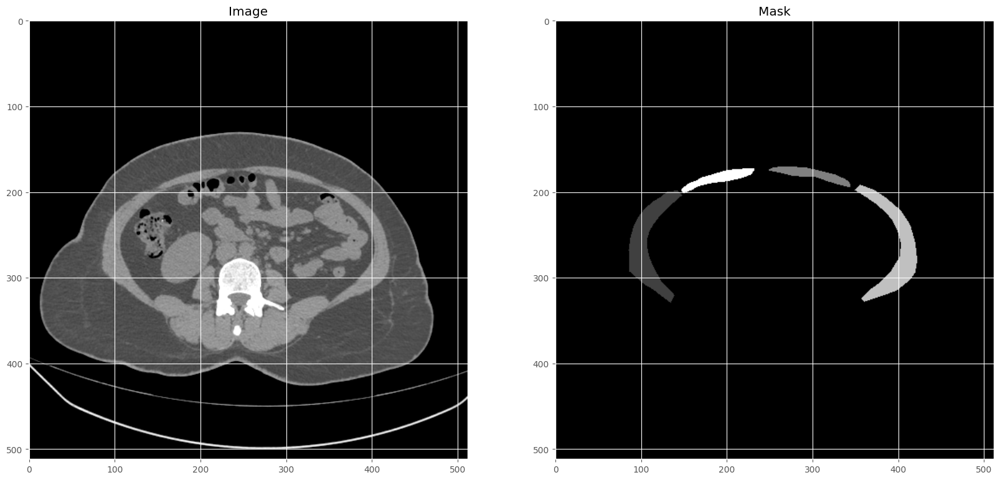

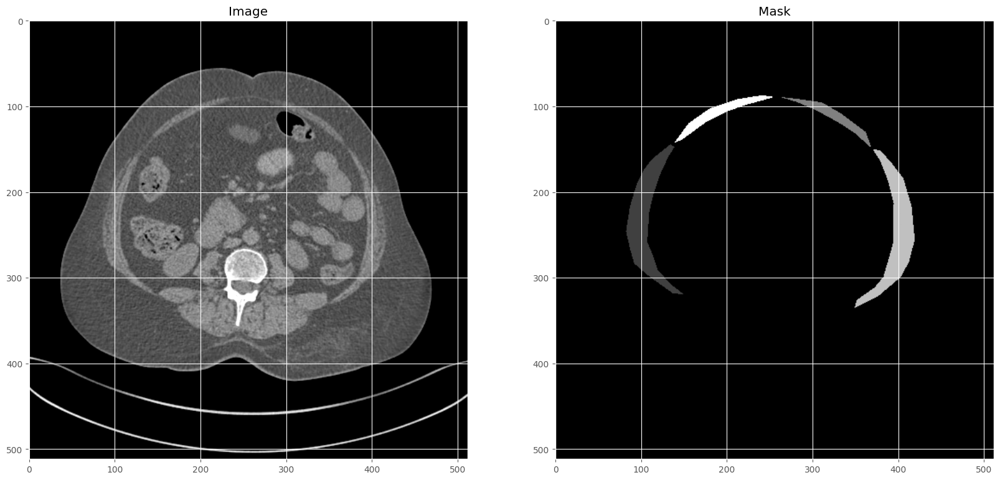

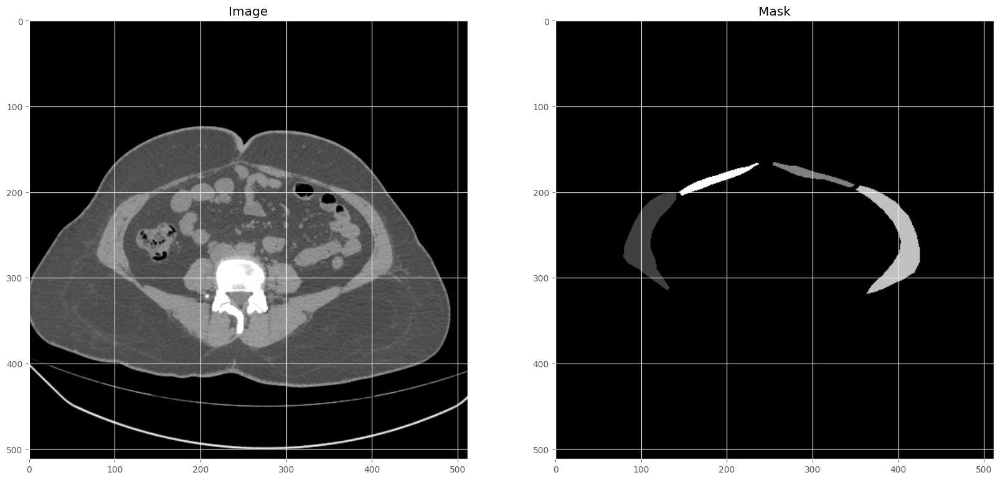

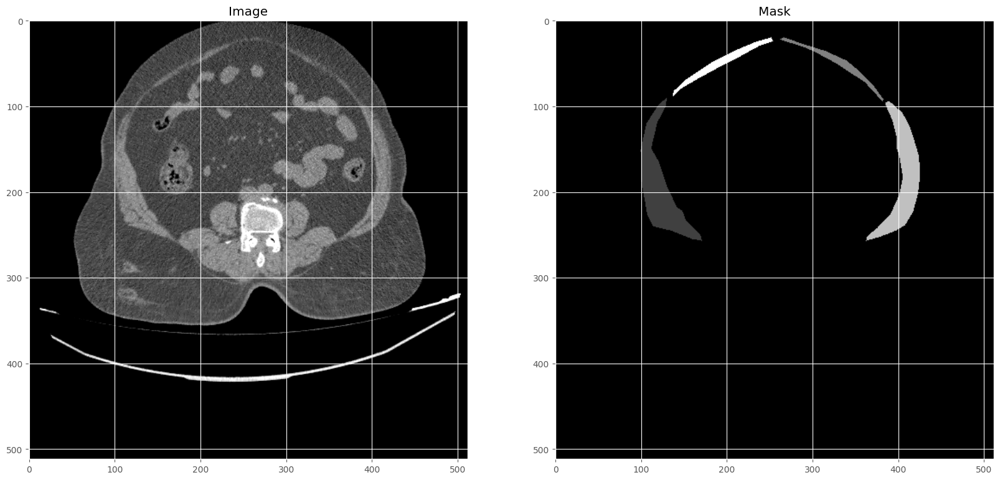

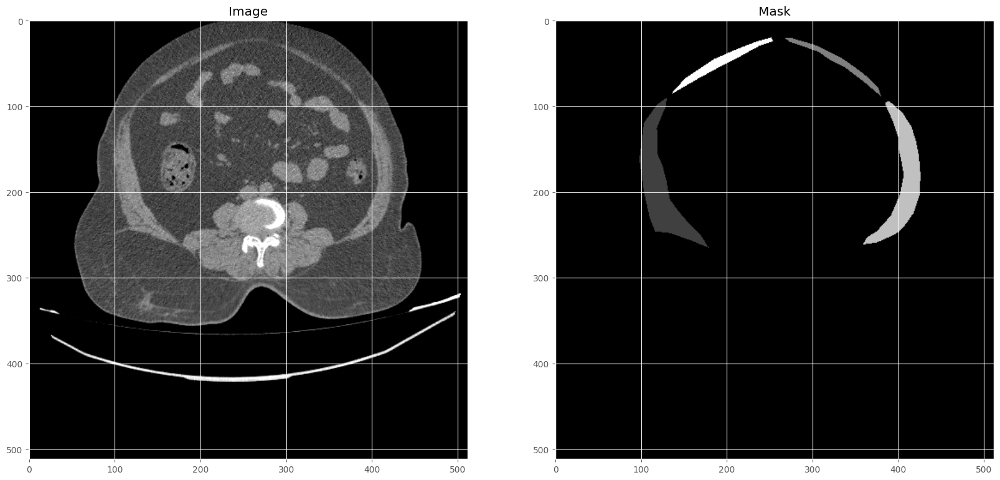

In [ ]:
pre_visualize(X_train, y_train, train_text)

						Validation 


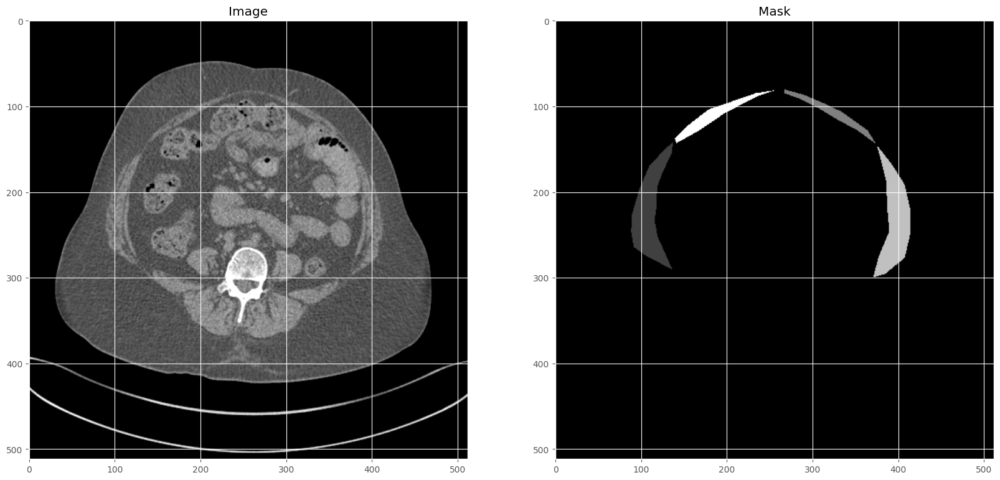

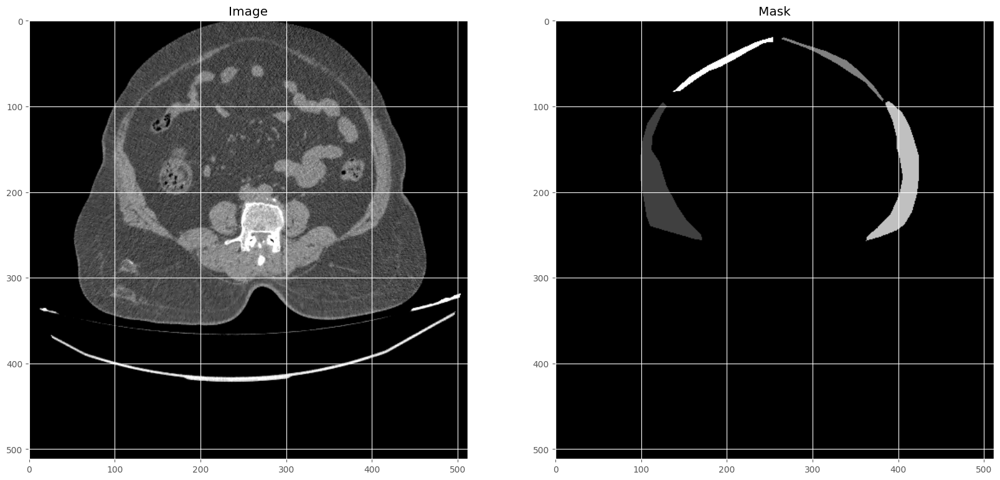

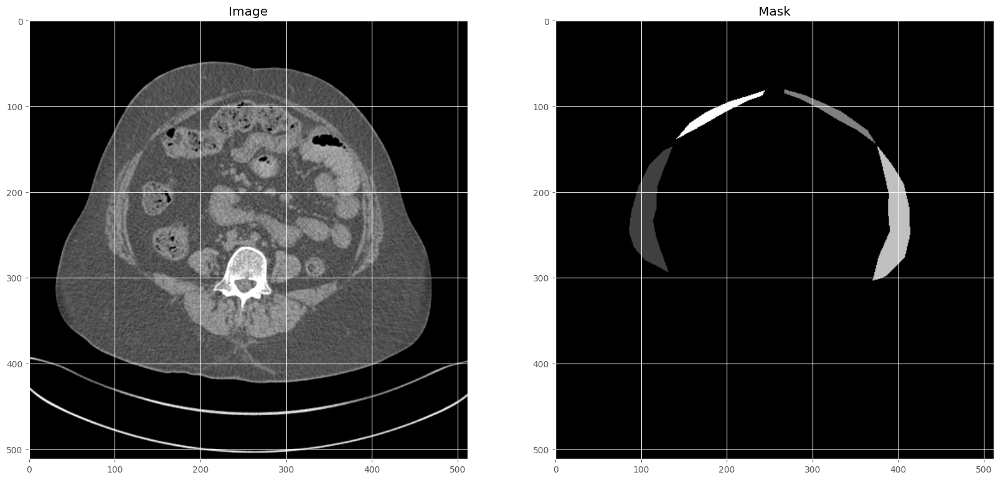

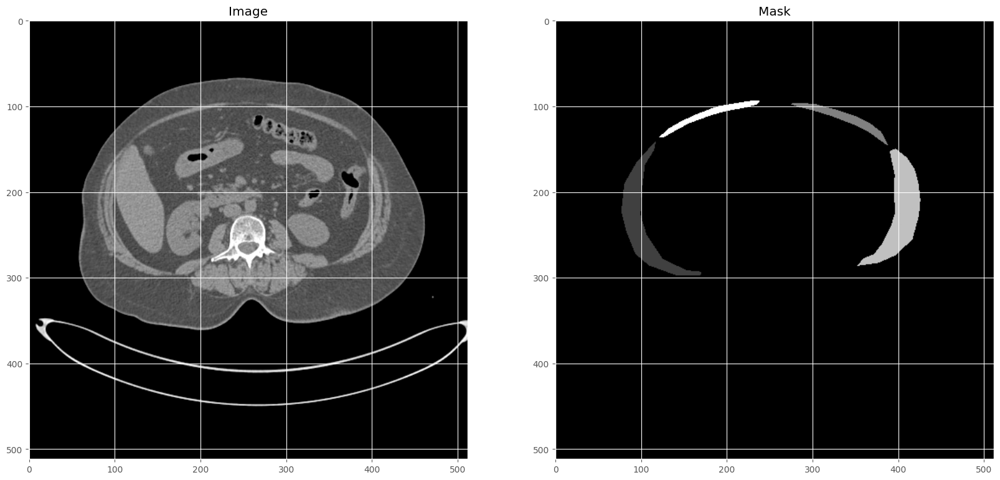

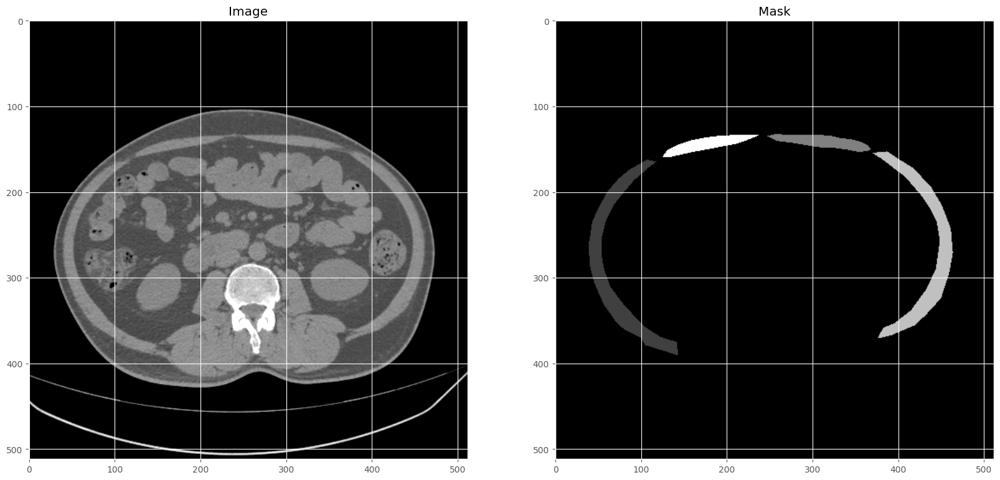

In [ ]:
pre_visualize(X_valid, y_valid, valid_text)

							Testing 


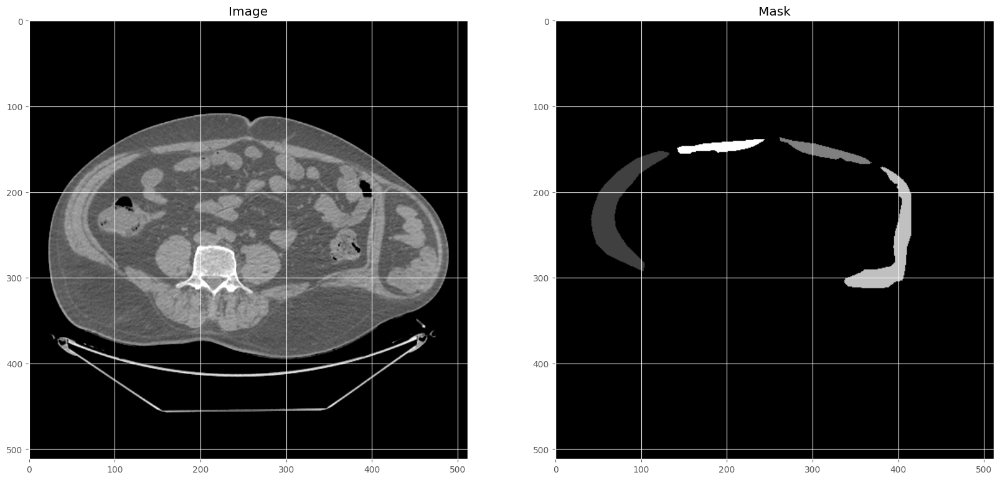

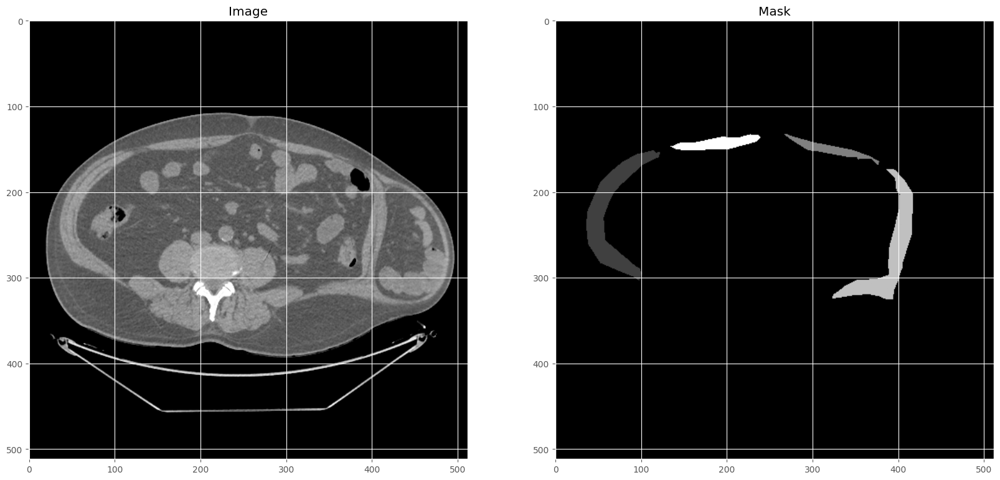

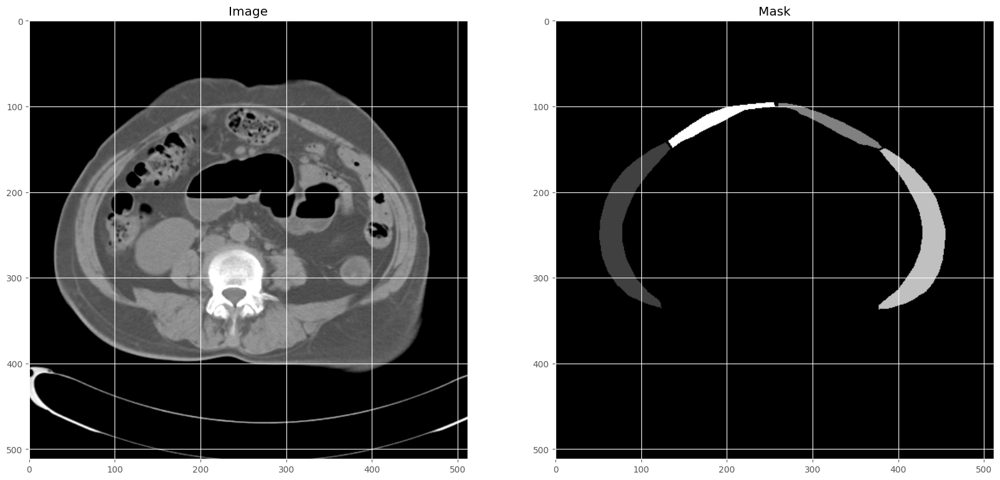

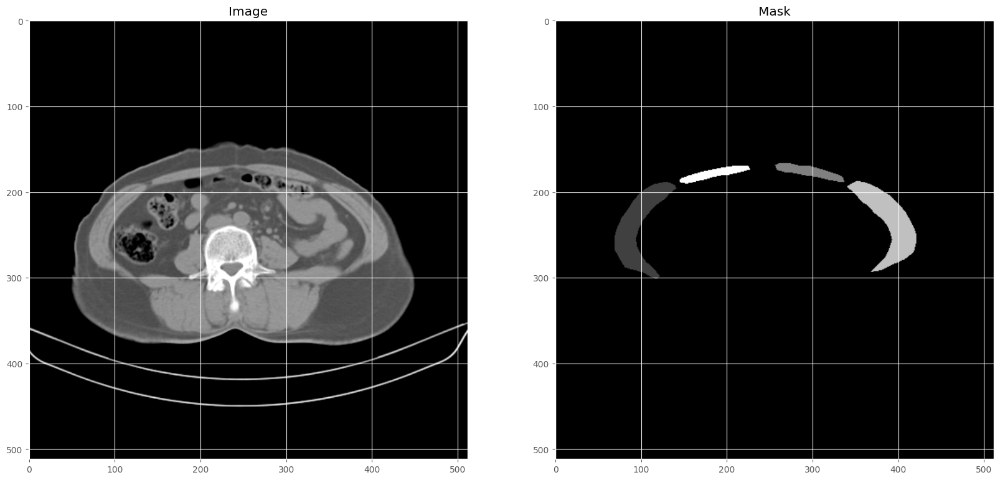

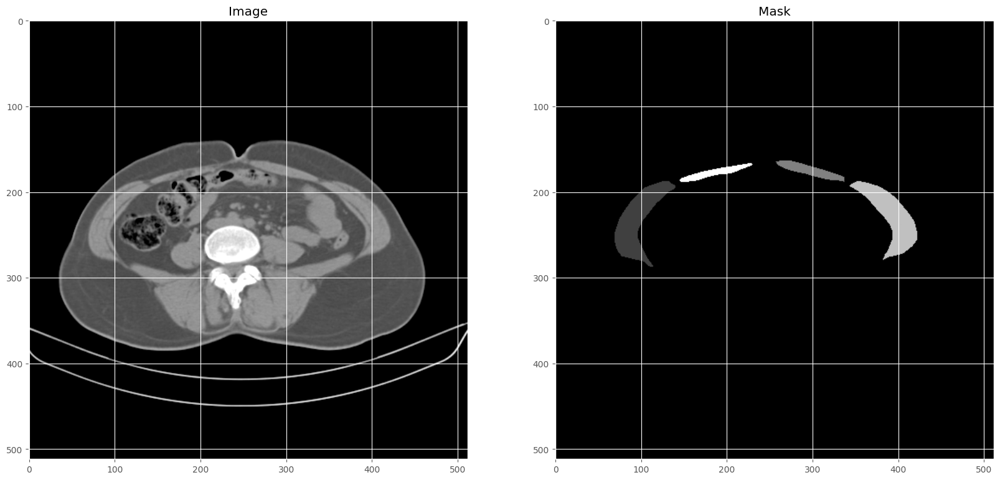

In [ ]:
pre_visualize(X_test, y_test, test_text)

In [ ]:
train_masks_cat = to_categorical(y_train, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

valid_masks_cat = to_categorical(y_valid, num_classes=n_classes)
y_valid_cat = valid_masks_cat.reshape((y_valid.shape[0], y_valid.shape[1], y_valid.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))


In [ ]:
y_train_cat.shape

(180, 512, 512, 5)

In [ ]:
class_weights = class_weight.compute_class_weight('balanced',
                                                 classes = np.unique(y_encoded),
                                                 y = y_encoded)
print("Class weights are...:", class_weights)


Class weights are...: [ 0.20746934 13.65128841 52.71054486 14.48321784 53.36024318]


In [ ]:
#Reused parameters in all models

n_classes=5
activation='softmax'

LR = 0.0001


# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (car: 1.; pedestrian: 2.; background: 0.5;)

dice_loss = sm.losses.DiceLoss(class_weights=np.array(class_weights)) 

#focal_loss = sm.losses.CategoricalFocalLoss()
#total_loss = dice_loss + (1 * focal_loss)

#total_loss = sm.losses.categorical_focal_dice_loss 

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]


In [ ]:
from keras import backend as K


def dice_loss(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f* y_pred_f)
    val = (2. * intersection + K.epsilon()) / (K.sum(y_true_f * y_true_f) + K.sum(y_pred_f * y_pred_f) + K.epsilon())
    return 1. - val

In [ ]:
from segmentation_models import Unet

###Model 1
BACKBONE_RESNET = 'resnet34'
preprocess_input_RESNET = sm.get_preprocessing(BACKBONE_RESNET)

# preprocess input
X_train_RESNET = preprocess_input_RESNET(X_train)
X_valid_RESNET = preprocess_input_RESNET(X_valid)
X_test_RESNET = preprocess_input_RESNET(X_test)

N = X_train_RESNET.shape[-1]
# define model
model_RESNET = Unet(backbone_name='resnet34', classes = n_classes, activation = 'softmax',  encoder_weights=None, input_shape=(None, None, N))

# compile keras model with defined optimozer, loss and metrics
model_RESNET.compile(optimizer=Adam(), loss =  K.categorical_crossentropy, metrics='accuracy')

#model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

print(model_RESNET.summary())


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 bn_data (BatchNormalization)   (None, None, None,   9           ['data[0][0]']                   
                                3)                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['bn_data[0][0]']                
                                3)                                                          

Training


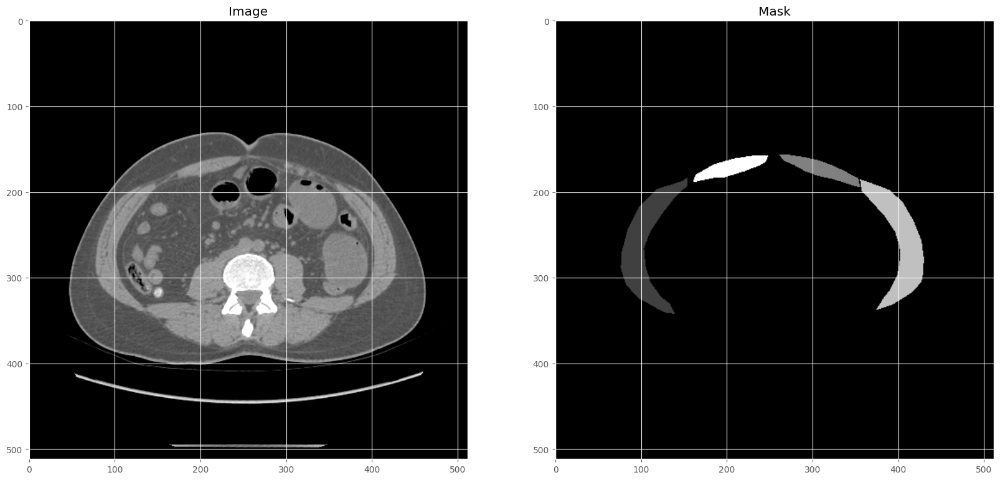

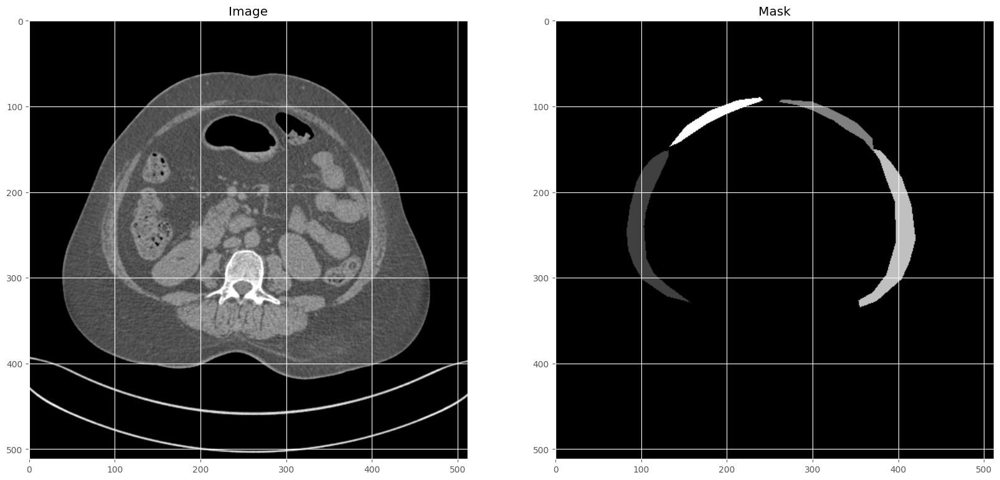

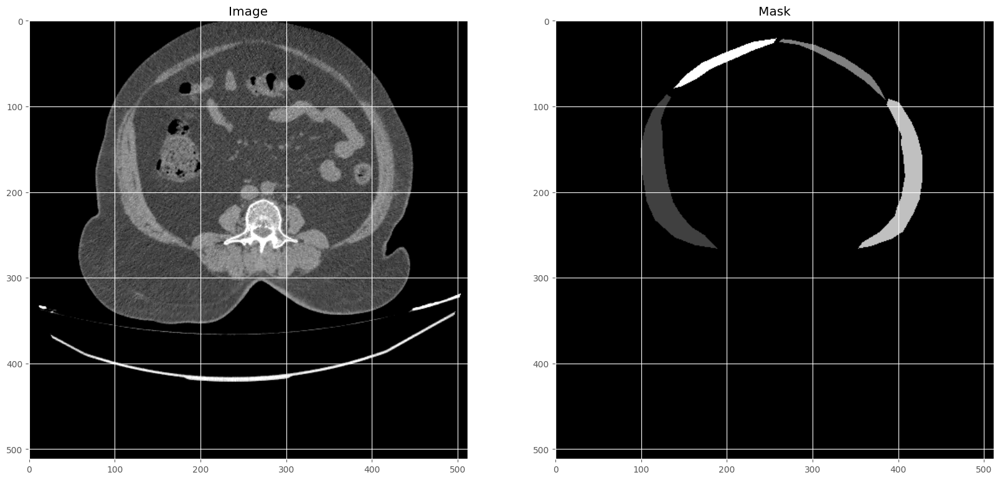

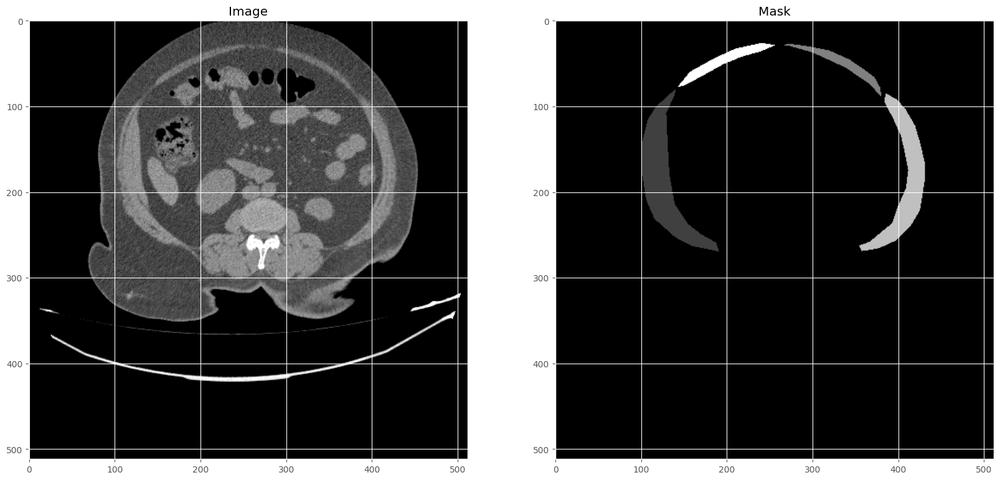

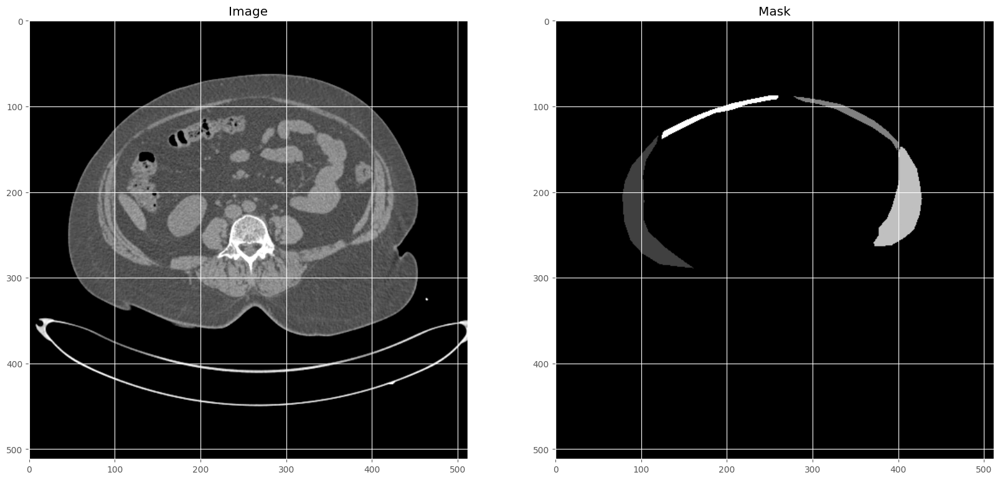

In [ ]:
from segmentation_models import Unet
pre_visualize(X_valid_RESNET,y_valid, "Training")

In [ ]:
y_train.shape

(180, 512, 512, 1)

In [ ]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('RESNET_UNet.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

results = model_RESNET.fit(X_train_RESNET, y_train_cat, batch_size=16, epochs=80, callbacks=callbacks,\
                    validation_data=(X_valid_RESNET, y_valid_cat))




Epoch 1/80
12/12 [==============================] - ETA: 0s - loss: 0.7991 - accuracy: 0.8454
Epoch 1: val_loss improved from inf to 275220736.00000, saving model to RESNET_UNet.h5
12/12 [==============================] - 78s 2s/step - loss: 0.7991 - accuracy: 0.8454 - val_loss: 275220736.0000 - val_accuracy: 0.9610 - lr: 0.0010
Epoch 2/80
12/12 [==============================] - ETA: 0s - loss: 0.2576 - accuracy: 0.9747
Epoch 2: val_loss improved from 275220736.00000 to 4911763.00000, saving model to RESNET_UNet.h5
12/12 [==============================] - 13s 1s/step - loss: 0.2576 - accuracy: 0.9747 - val_loss: 4911763.0000 - val_accuracy: 0.9630 - lr: 0.0010
Epoch 3/80
12/12 [==============================] - ETA: 0s - loss: 0.1302 - accuracy: 0.9757
Epoch 3: val_loss improved from 4911763.00000 to 43385.75781, saving model to RESNET_UNet.h5
12/12 [==============================] - 12s 1s/step - loss: 0.1302 - accuracy: 0.9757 - val_loss: 43385.7578 - val_accuracy: 0.9630 - lr: 0.00

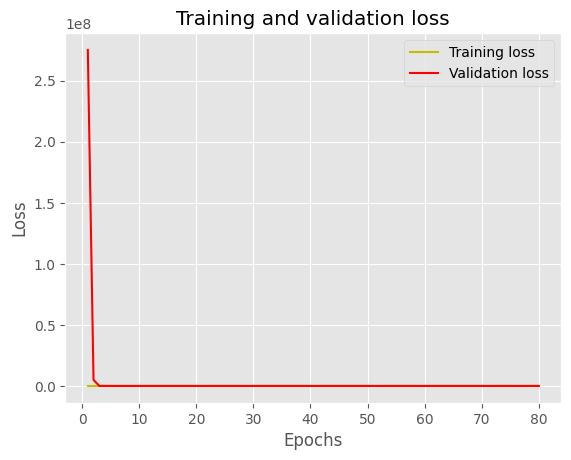

In [ ]:
#plot the training and validation accuracy and loss at each epoch
loss = results.history['loss']
val_loss = results.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()



In [ ]:
# load the best model
model_RESNET.load_weights('RESNET_UNet.h5')
#model1 = load_model('saved_models/res34_backbone_50epochs.hdf5', compile=False)

In [ ]:
# Evaluate on validation set (this must be equals to the best log_loss)
model_RESNET.evaluate(X_train_RESNET, y_train_cat, verbose=1)
model_RESNET.evaluate(X_valid_RESNET, y_valid_cat, verbose=1)
model_RESNET.evaluate(X_test, y_test_cat, verbose =1)
#model.evaluate(X_test, y_test, verbose=1)

1/1 [==============================] - 11s 11s/step - loss: 0.0435 - accuracy: 0.9884


[0.04346141964197159, 0.9884440898895264]

In [ ]:
# Predict on train, val and test
preds_train = model_RESNET.predict(X_train_RESNET, verbose=1)
pred_train_argmax=np.argmax(preds_train, axis=3)

preds_val = model_RESNET.predict(X_valid_RESNET, verbose=1)
pred_val_argmax=np.argmax(preds_val, axis=3)

preds_test = model_RESNET.predict(X_test, verbose=1)
pred_test_argmax=np.argmax(preds_test, axis=3)


1/1 [==============================] - 0s 97ms/step


In [ ]:
preds_train.shape

(180, 512, 512, 5)

In [ ]:
from keras.metrics import MeanIoU
n_classes = 5
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_train[:,:,:,0], pred_train_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3]+values[0,4] + values[1,0]+ values[2,0]+ values[3,0]+values[4,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3]+values[1,4] + values[0,1]+ values[2,1]+ values[3,1]+values[4,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3]+values[2,4] + values[0,2]+ values[1,2]+ values[3,2]+values[4,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2]+values[3,4] + values[0,3]+ values[1,3]+ values[2,3]+values[4,3])
class5_IoU = values[4,4]/(values[4,4] + values[4,0] + values[4,1] + values[4,2]+values[4,3] + values[0,4]+ values[1,4]+ values[2,4]+values[3,4])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)
print("IoU for class5 is: ", class5_IoU)

Mean IoU = 0.9208044
[[1.6777216e+07 1.7842000e+04 1.2802000e+04 1.6776000e+04 1.1243000e+04]
 [2.5895000e+04 6.5741200e+05 0.0000000e+00 0.0000000e+00 6.0000000e+00]
 [1.2912000e+04 0.0000000e+00 1.6509100e+05 3.0000000e+00 0.0000000e+00]
 [2.5086000e+04 0.0000000e+00 2.0000000e+00 6.2385800e+05 0.0000000e+00]
 [1.2698000e+04 1.0000000e+00 0.0000000e+00 0.0000000e+00 1.6327100e+05]]
IoU for class1 is:  0.9920026
IoU for class2 is:  0.9376116
IoU for class3 is:  0.8652115
IoU for class4 is:  0.93711066
IoU for class5 is:  0.87208563


In [ ]:
from keras.metrics import MeanIoU
n_classes = 5
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_valid[:,:,:,0], pred_val_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3]+values[0,4] + values[1,0]+ values[2,0]+ values[3,0]+values[4,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3]+values[1,4] + values[0,1]+ values[2,1]+ values[3,1]+values[4,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3]+values[2,4] + values[0,2]+ values[1,2]+ values[3,2]+values[4,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2]+values[3,4] + values[0,3]+ values[1,3]+ values[2,3]+values[4,3])
class5_IoU = values[4,4]/(values[4,4] + values[4,0] + values[4,1] + values[4,2]+values[4,3] + values[0,4]+ values[1,4]+ values[2,4]+values[3,4])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)
print("IoU for class5 is: ", class5_IoU)

Mean IoU = 0.9100356
[[1.1594545e+07 5.1090000e+03 3.5770000e+03 5.4470000e+03 3.2510000e+03]
 [9.1900000e+03 1.7542300e+05 0.0000000e+00 0.0000000e+00 4.4000000e+01]
 [4.2170000e+03 0.0000000e+00 4.2567000e+04 2.0000000e+00 0.0000000e+00]
 [6.8280000e+03 0.0000000e+00 1.0000000e+00 1.6233800e+05 0.0000000e+00]
 [3.8920000e+03 0.0000000e+00 0.0000000e+00 0.0000000e+00 4.2193000e+04]]
IoU for class1 is:  0.99643254
IoU for class2 is:  0.92441744
IoU for class3 is:  0.84518707
IoU for class4 is:  0.9296857
IoU for class5 is:  0.85445523


In [ ]:
from keras.metrics import MeanIoU
n_classes = 5
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_test[:,:,:,0], pred_test_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3]+values[0,4] + values[1,0]+ values[2,0]+ values[3,0]+values[4,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3]+values[1,4] + values[0,1]+ values[2,1]+ values[3,1]+values[4,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3]+values[2,4] + values[0,2]+ values[1,2]+ values[3,2]+values[4,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2]+values[3,4] + values[0,3]+ values[1,3]+ values[2,3]+values[4,3])
class5_IoU = values[4,4]/(values[4,4] + values[4,0] + values[4,1] + values[4,2]+values[4,3] + values[0,4]+ values[1,4]+ values[2,4]+values[3,4])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)
print("IoU for class5 is: ", class5_IoU)

Mean IoU = 0.7507329
[[6.54086e+06 9.63500e+03 6.79700e+03 1.54940e+04 5.51900e+03]
 [1.07070e+04 8.56770e+04 0.00000e+00 0.00000e+00 2.77000e+02]
 [2.69600e+03 0.00000e+00 2.12300e+04 3.42000e+02 0.00000e+00]
 [2.24470e+04 0.00000e+00 3.63000e+02 7.00790e+04 0.00000e+00]
 [3.89400e+03 9.10000e+01 5.00000e+02 0.00000e+00 1.91360e+04]]
IoU for class1 is:  0.98833656
IoU for class2 is:  0.8053334
IoU for class3 is:  0.6649336
IoU for class4 is:  0.64455277
IoU for class5 is:  0.6505082


In [ ]:
#Function for viewing plots and predictions
def plot_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 

  
    
    for i in range(5) : 
        if ix is None:
            ix = random.randint(0, len(X)-1)
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        #d_loss = dice_loss(y[ix],preds[ix]).numpy()
        #d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        #text_1 = "Dice loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        #plt.figtext(0.4, 0.2, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        ix = None

						Training 


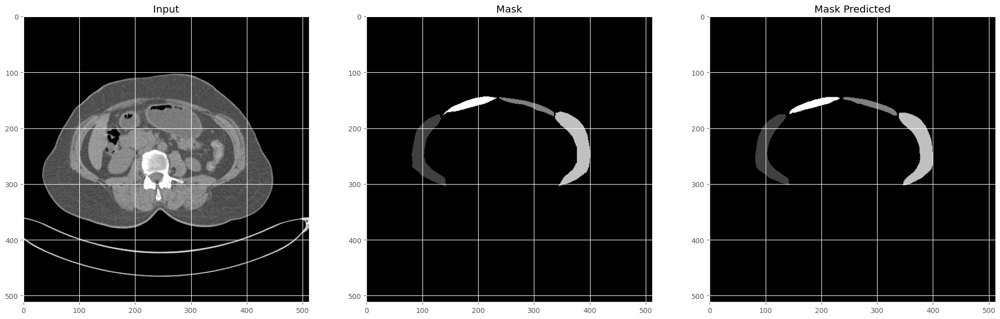

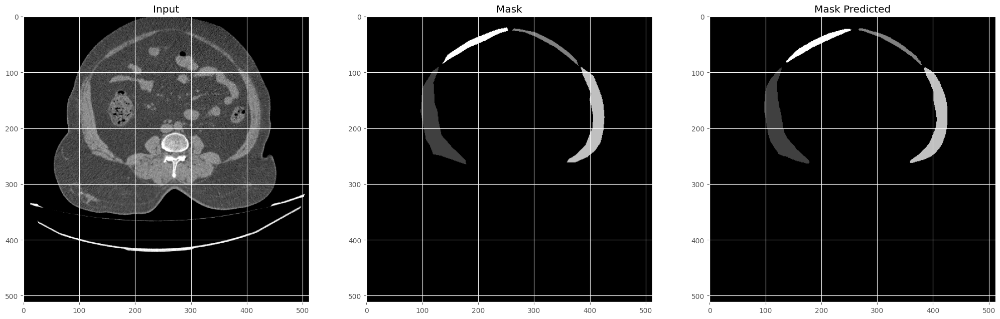

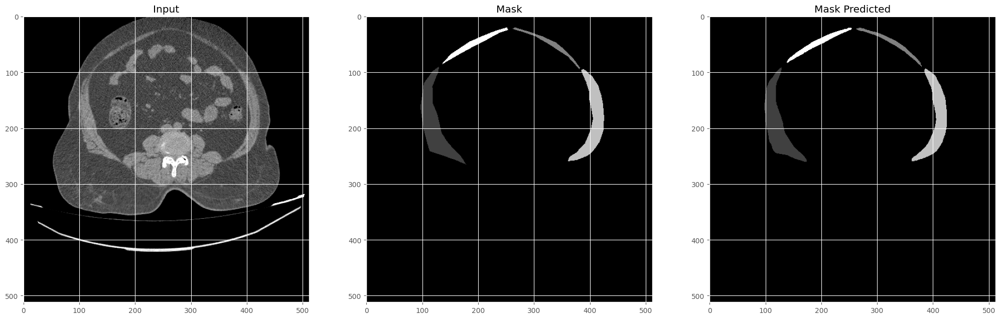

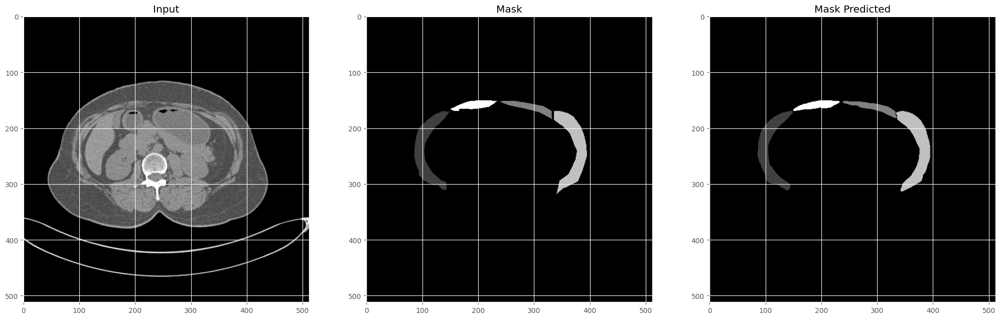

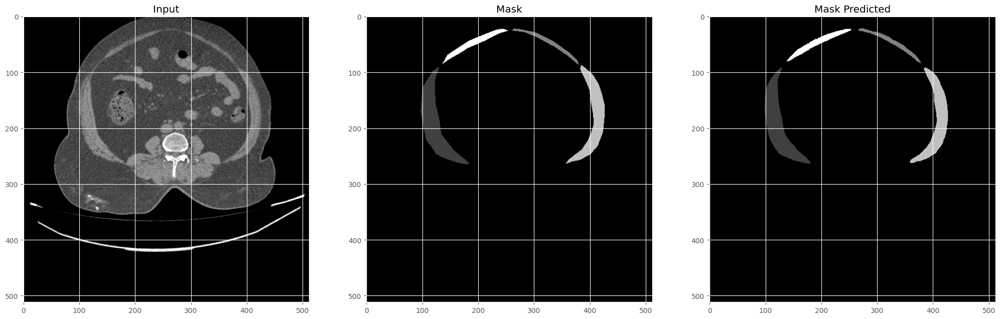

In [ ]:
plot_sample(X_train, y_train, pred_train_argmax, train_text)

						Validation 


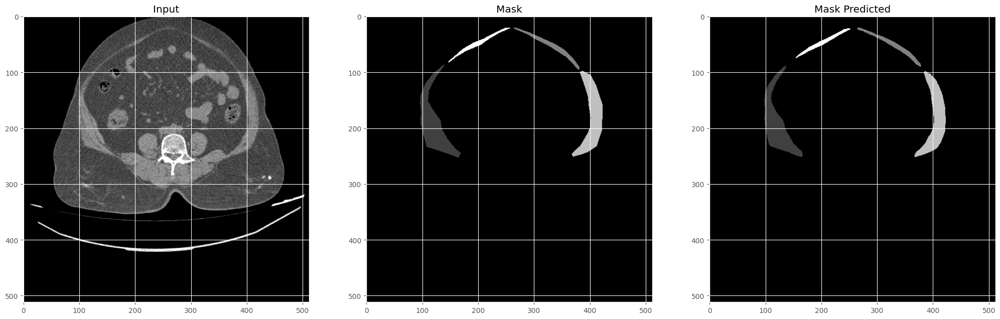

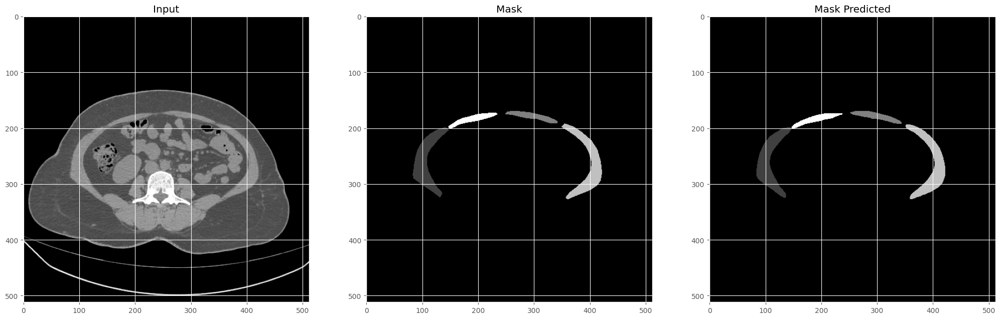

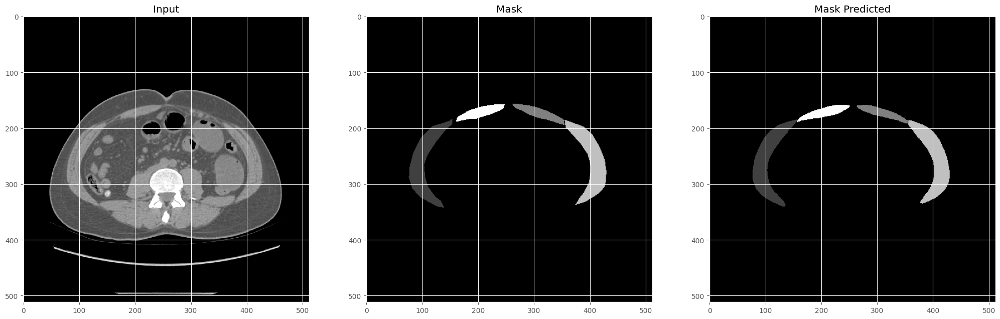

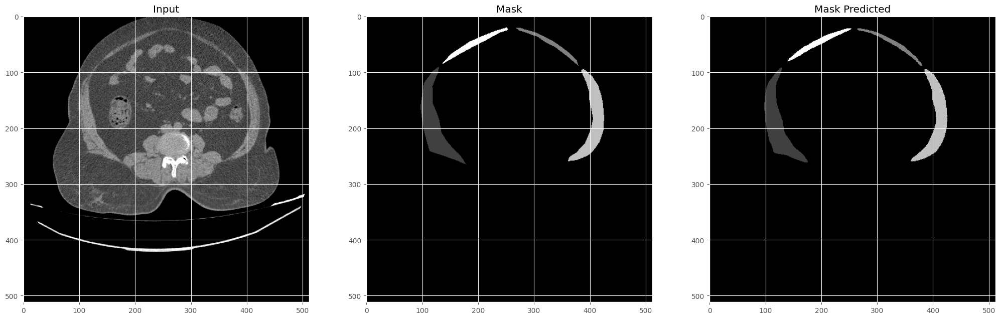

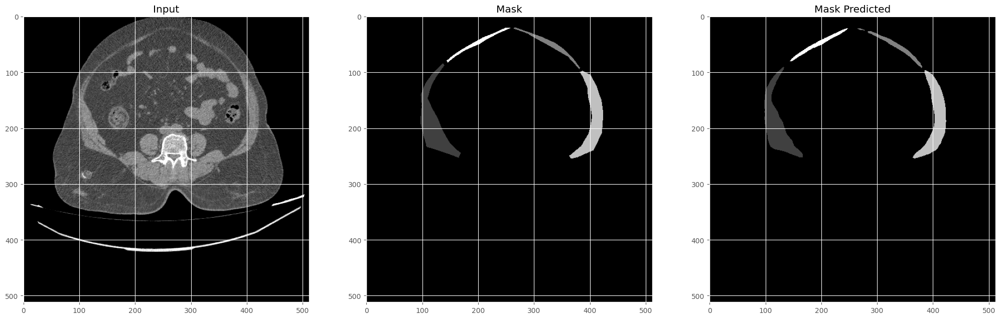

In [ ]:
plot_sample(X_valid, y_valid, pred_val_argmax, valid_text)

							Testing 


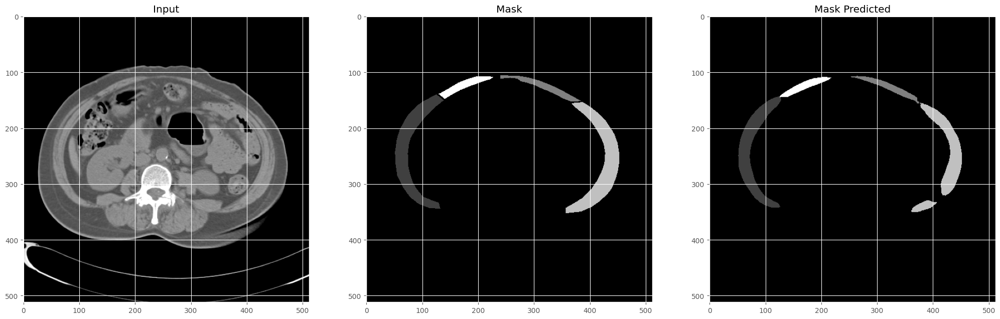

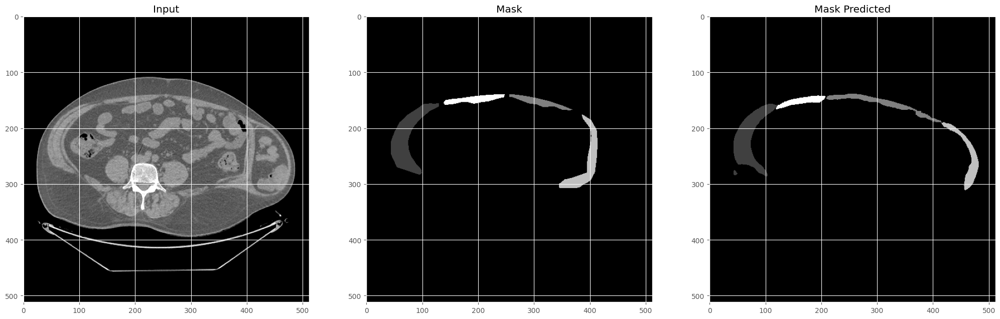

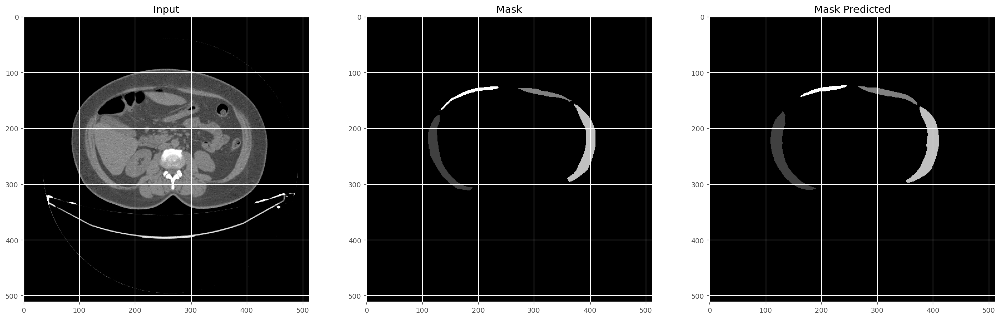

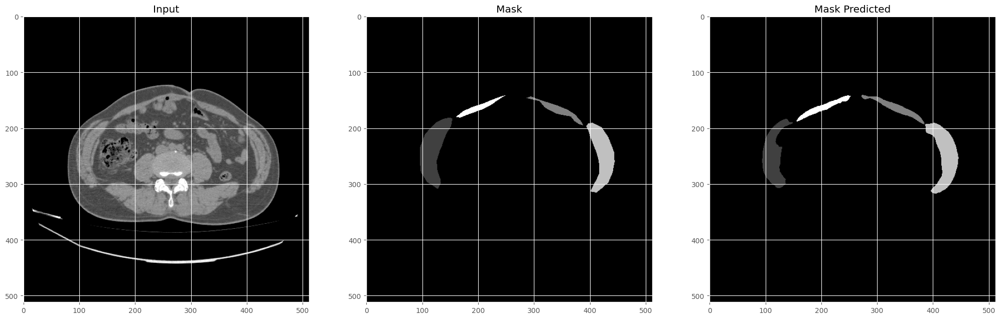

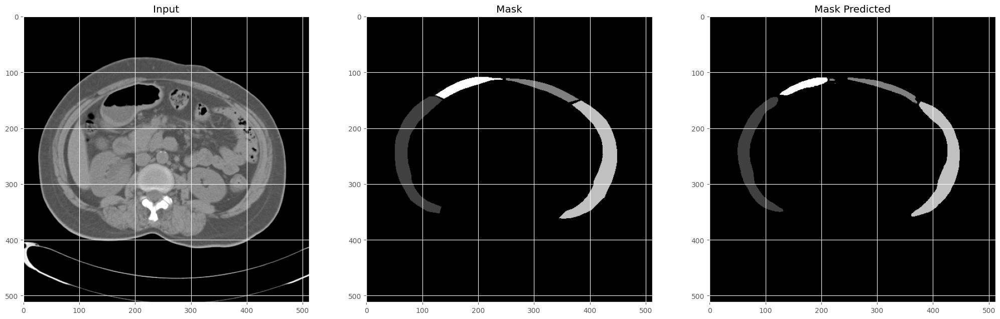

In [ ]:
plot_sample(X_test, y_test, pred_test_argmax, test_text)

In [ ]:
def avg_loss():
    d_loss_train = 0
    d_loss_valid = 0
    d_loss_test = 0

    temp = 0

    d_loss_train_list = []
    d_loss_valid_list = []
    d_loss_test_list = []
    
    for i in tqdm(range(0,len(X_train))):
        #temp = resize(preds_train[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_train = dice_loss(y_train[i],pred_train_argmax[i]).numpy()
        d_loss_train_list.append(d_loss_train)
        
    #d_loss_train_std = statistics.stdev(d_loss_train_list)
    #d_loss_train_avg = statistics.mean(d_loss_train_list)
    
    temp = 0
    
    
    for i in tqdm(range(0,len(X_valid))):
        #temp = resize(preds_val[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_valid = dice_loss(y_valid[i],preds_val_argmax[i]).numpy()
        d_loss_valid_list.append(d_loss_valid)
        
    temp = 0
    
    for i in tqdm(range(0,len(X_test))):
        #temp = resize(preds_test[i], (512, 512, 1), mode = 'constant', preserve_range = True)
        #temp_2 = temp_2/255.0
        d_loss_test = dice_loss(y_test[i],pred_test_argmax[i]).numpy()
        d_loss_test_list.append(d_loss_test)
        
        

    #d_loss_valid_std = statistics.stdev(d_loss_valid_list)
    #d_loss_valid_avg = statistics.mean(d_loss_valid_list)
    return d_loss_train_list, d_loss_valid_list, d_loss_test_list
#d_loss_train_avg,d_loss_valid_avg,d_loss_train_std,d_loss_valid_std

In [ ]:
a,b,c = avg_loss() #List of training and validation values
print(len(a),len(b), len(c))

  0%|          | 0/180 [00:00<?, ?it/s]


TypeError: ignored

In [ ]:
case_1 = c[:5:]
case_5 = c[5:10:]
case_3 = c[10:15:]
case_4 = c[15:21:]
case_2 = c[21::]

In [ ]:
import statistics
print("Mean Dice loss of custom-100 U-Net for training: ",statistics.mean(a), " Max : ", max(a), "Min :", min(a))
print("Mean Dice loss of custom-100 U-Net for valid: ",statistics.mean(b), "Max : ", max(b), "Min : ", min(b))

Mean Dice loss of custom-100 U-Net for training:  0.018636758  Max :  0.026724339 Min : 0.012643516
Mean Dice loss of custom-100 U-Net for valid:  0.035270665 Max :  0.08434123 Min :  0.021407723


In [ ]:
print("Mean Dice loss of custom-100 U-Net for test-1: ",statistics.mean(case_1), "Max : ", max(case_1), "Min : ", min(case_1))
print("Mean Dice loss of custom-100 U-Net for test-2: ",statistics.mean(case_2), "Max : ", max(case_2), "Min : ", min(case_2))
print("Mean Dice loss of custom-100 U-Net for test-3: ",statistics.mean(case_3), "Max : ", max(case_3), "Min : ", min(case_3))
print("Mean Dice loss of custom-100 U-Net for test-4: ",statistics.mean(case_4), "Max : ", max(case_4), "Min : ", min(case_4))
print("Mean Dice loss of custom-100 U-Net for test-5: ",statistics.mean(case_5), "Max : ", max(case_5), "Min : ", min(case_5))

Mean Dice loss of custom-100 U-Net for test-1:  0.095002696 Max :  0.107186496 Min :  0.076640904
Mean Dice loss of custom-100 U-Net for test-2:  0.08975726 Max :  0.10581756 Min :  0.07574648
Mean Dice loss of custom-100 U-Net for test-3:  0.15141845 Max :  0.17063057 Min :  0.12161863
Mean Dice loss of custom-100 U-Net for test-4:  0.08293738 Max :  0.114935935 Min :  0.059007823
Mean Dice loss of custom-100 U-Net for test-5:  0.46103922 Max :  0.48559862 Min :  0.4382996


In [ ]:
case_1 = c[:5:]
case_2 = c[5:10:]
case_3 = c[10:15:]
case_4 = c[15:21:]
case_5 = c[21::]
import statistics
print("Mean Dice loss of Custom U-Net for training: ",statistics.mean(a), " Max : ", max(a), "Min :", min(a))
print("Mean Dice loss of Custom U-Net for valid: ",statistics.mean(b), "Max : ", max(b), "Min : ", min(b))
print("Mean Dice loss of Custom U-Net for test-1: ",statistics.mean(case_1), "Max : ", max(case_1), "Min : ", min(case_1))
print("Mean Dice loss of Custom U-Net for test-2: ",statistics.mean(case_5), "Max : ", max(case_5), "Min : ", min(case_5))
print("Mean Dice loss of Custom U-Net for test-3: ",statistics.mean(case_3), "Max : ", max(case_3), "Min : ", min(case_3))
print("Mean Dice loss of Custom U-Net for test-4: ",statistics.mean(case_4), "Max : ", max(case_4), "Min : ", min(case_4))

Mean Dice loss of Custom U-Net for training:  0.023343066  Max :  0.044245422 Min : 0.015449822
Mean Dice loss of Custom U-Net for valid:  0.035214063 Max :  0.06984943 Min :  0.018490016
Mean Dice loss of Custom U-Net for test-1:  0.1629959 Max :  0.20095581 Min :  0.13180673
Mean Dice loss of Custom U-Net for test-2:  0.08518515 Max :  0.09171295 Min :  0.075518966
Mean Dice loss of Custom U-Net for test-3:  0.09271431 Max :  0.106744945 Min :  0.07516074
Mean Dice loss of Custom U-Net for test-4:  0.0909833 Max :  0.11541277 Min :  0.07203126


In [ ]:
test_folders

['SS_EA001', 'SS_EA002', 'SS_EA025', 'SS_EA034', 'SS_EA041']

In [ ]:
#Function for viewing plots and predictions
def final_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 
    
    for i in range(5) : 
        if ix is None:
            ix = random.randint(0, len(X)-1)
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        d_loss = dice_loss(y[ix],preds[ix]).numpy()
        d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        text_1 = "Complete loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        plt.figtext(0.4, 0.27, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        ix = None

						Validation 


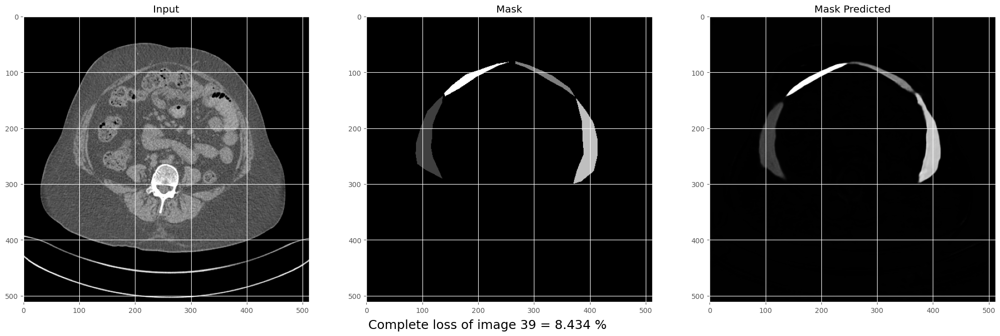

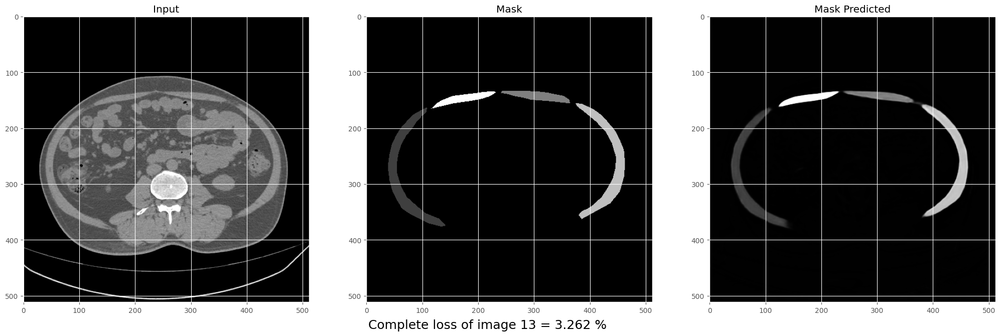

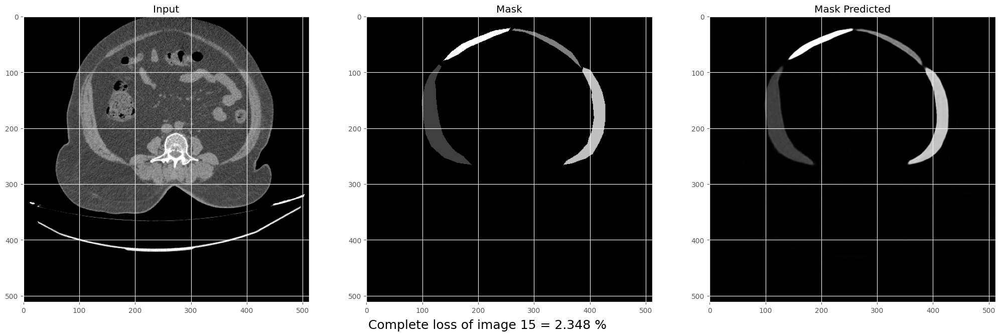

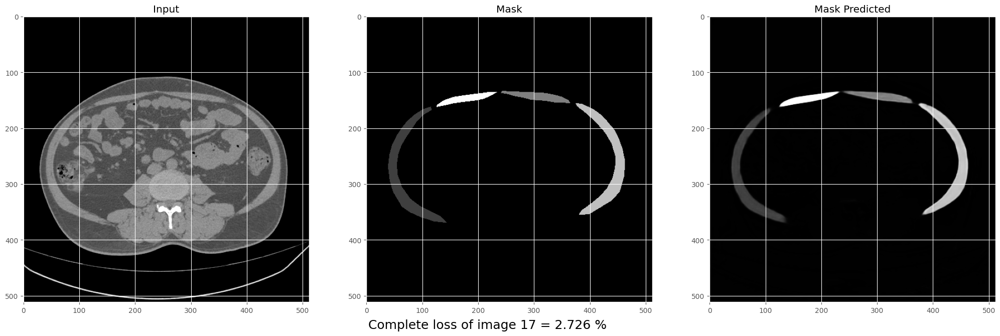

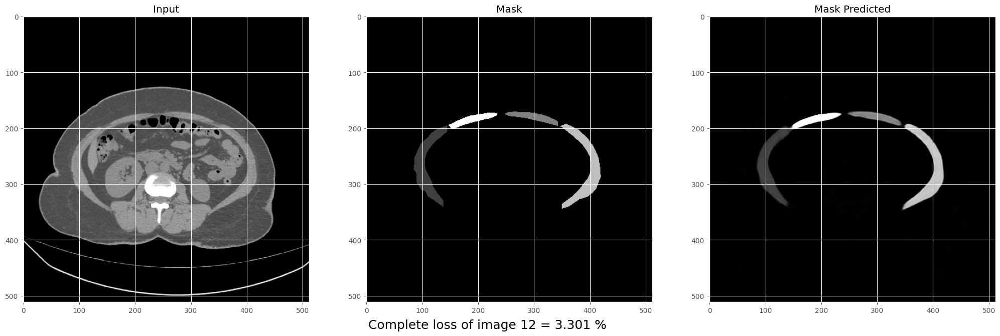

In [ ]:
final_sample(X_valid, y_valid, preds_val,valid_text)

In [ ]:
#Function for viewing plots and predictions
def test_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 
    
    for i in range(len(X)) : 
        ix = i
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        d_loss = dice_loss(y[ix],preds[ix]).numpy()
        d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        text_1 = "Dice loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        plt.figtext(0.4, 0.27, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        #ix = None

							Testing 


<ipython-input-51-9cd3ba48fbb9>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(25, 15))


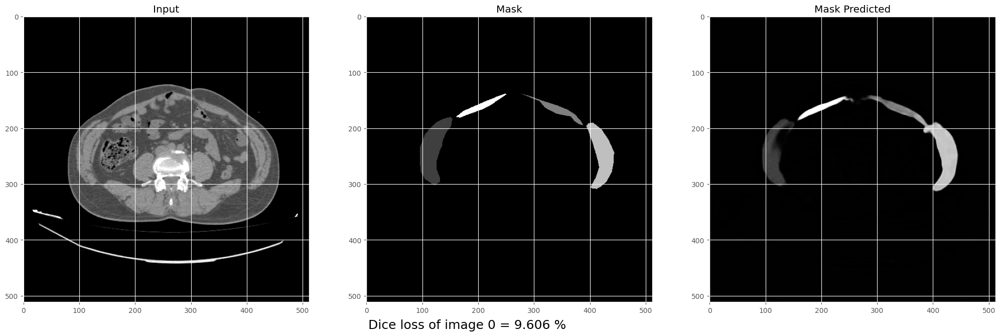

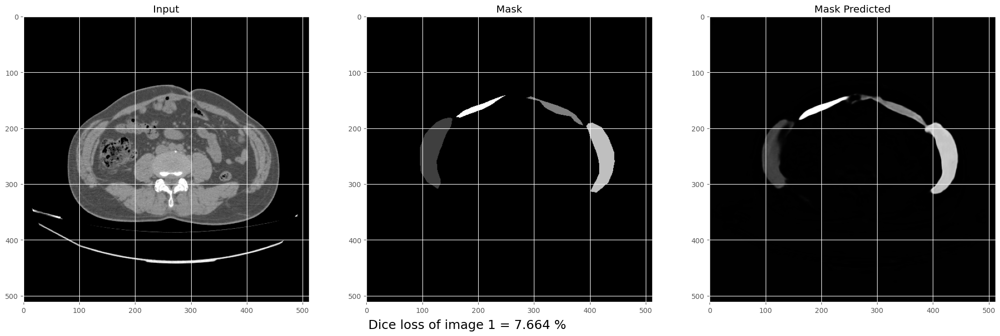

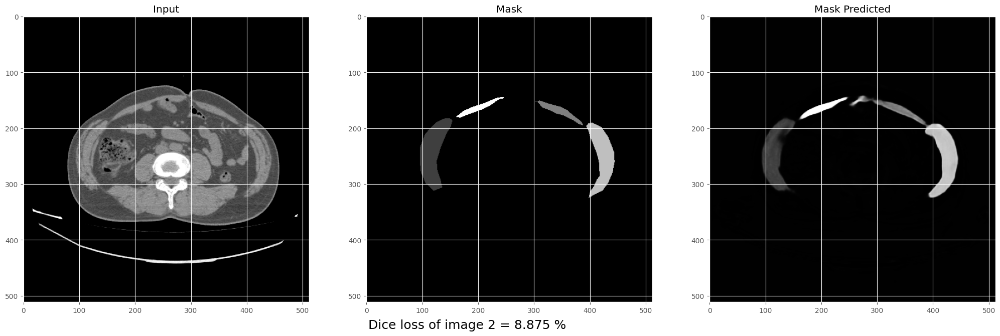

Error in callback <function flush_figures at 0x7f324c059000> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
test_sample(X_test, y_test, preds_test,test_text)